# Spectrum reconstruction under growing perturbation: baseline against the penalized model

`part_5` established that the Fisher-Rao spectral-plus-hinge penalty makes the encoder
measurably harder to displace, as an aggregate over 2000 pixels and 45 models. This notebook
shows that effect on individual spectra, at a level a reader can inspect: the same spectrum,
perturbed step by step, reconstructed side by side by two models.

Two models are compared, the unregularized baseline and the penalized model at
$\lambda=2\times10^{-3}$, which is the candidate whose robustness gain `part_5` found most
reproducible across seeds. `part_0_3` covers what the perturbations do to the input itself,
without any model; this notebook is the model-facing half of that pair.

## Introduction

The question is whether the smaller latent displacement `part_5` measured actually reaches
the output. A penalty that stabilizes the code without stabilizing the reconstruction would
be regularizing a quantity that does not propagate, and only a comparison at the level of the
decoded spectrum can tell.

Three things are tracked as the perturbation grows: the perturbed input, so the size of the
change being asked about is visible; each model's reconstruction, so their responses can be
compared directly; and the disagreement between the two models, drawn as the band between
their reconstructions.

### Assumptions

- **Both models were trained with the same reconstruction objective** and differ only in the
  encoder's contractive term, so a difference in reconstruction under perturbation is
  attributable to the encoder rather than to the decoder or the loss.
- **Both models retain the same latent variation.** `part_4` measured the penalized model at
  103.5% of the baseline's latent trace, so a smaller response here is robustness and not the
  collapse `part_2` documented for the Euclidean penalty. Without that check, a model that
  simply ignores its input would look best on every figure here.
- **Distances between spectra use the training objective, not the Euclidean norm.** Both
  models minimize `MassersteinLoss`, a transport cost on the m/z grid, and the campaign's
  premise is that a one-bin displacement is a small chemical change. A Euclidean distance
  contradicts that premise: with peaks about one bin wide it rates a one-bin shift as a
  near-total change. Every distance reported here is the Masserstein cost from
  `masserstein_distances`, the implementation the reconstruction analyses already use;
  Euclidean values are persisted alongside but not plotted.
- **Displayed spectra are selected by reconstruction quality, not at random.** Each model
  contributes its two best, two median and two worst clean reconstructions, so the figures
  are a stratified sample of behaviour rather than an arbitrary draw.
- **The zoom window is fixed across amplitudes** within a case. It is centred on the
  strongest peak of that case's clean spectrum and does not follow the perturbation, so a
  displacement is visible as structure moving inside the window rather than as the window
  moving with it.
- **Both models see identical inputs**, including identical noise draws for the stochastic
  families at every amplitude, so the comparison is paired at the spectrum level.

### Notation

For a spectrum $x$ and transform $T$, write $\delta=T(x)-x$ after TIC renormalization and
$x_t=\mathrm{TIC}(x+t\delta)$ for amplitude $t$. For model $m$ the reconstruction is
$\hat x^m_t=\mathrm{Dec}_m(\mathrm{Enc}_m(x_t))$ and $q_m(x_t)$ the unit latent direction.
Three quantities are reported: the latent displacement $\angle(q_m(x_0),q_m(x_t))$ in degrees,
the reconstruction drift $W(\hat x^m_t,\hat x^m_0)$, and the between-model disagreement
$W(\hat x^{A}_t,\hat x^{B}_t)$, where $W$ is the Masserstein transport cost on the binner's
m/z grid.

In [1]:
import hashlib
import json
import os
import subprocess
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.display import display

current_path = Path.cwd().resolve()
repository_root = next(path for path in (current_path, *current_path.parents) if (path / "pyproject.toml").is_file())
os.chdir(repository_root)

from msi_autoencoder_wrapper import MSIAutoEncoderWrapper
from msi_autoencoder_wrapper.analysis.autoencoder.experiments.entropy_status_reader import read_entropy_campaign
from msi_autoencoder_wrapper.analysis.autoencoder.experiments import penalty_sweep as sweep
from msi_autoencoder_wrapper.analysis.autoencoder.experiments import sweep_evaluation as evaluation
from msi_autoencoder_wrapper.analysis.autoencoder.latent import perturbations as perturbation
from msi_autoencoder_wrapper.analysis.autoencoder.latent import sphere_geometry as geometry
from msi_autoencoder_wrapper.analysis.autoencoder.latent.sensitivity import (
    canonical_direction, paired_direction_angles,
)
from msi_autoencoder_wrapper.analysis.autoencoder.reconstruction.metrics import masserstein_distances
from msi_autoencoder_wrapper.utils.logger import get_custom_logger
from msi_autoencoder_wrapper.visualization import resolve_theme
from msi_autoencoder_wrapper.visualization.spectra.views import plot_spectrum_comparison

logger = get_custom_logger("spectrum_reconstruction")

2026-09-07 23:12:44,631 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 1 implementation module(s) in package 'msi_autoencoder_wrapper.binners.binners_strategies'.


2026-09-07 23:12:44,634 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 6 implementation module(s) in package 'msi_autoencoder_wrapper.binners.inverse_strategies'.


2026-09-07 23:12:46,183 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 3 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures.types.autoencoders.presets'.


2026-09-07 23:12:46,185 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 23 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures.types.autoencoders'.


2026-09-07 23:12:46,188 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 0 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures.types.schema'.


2026-09-07 23:12:46,190 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:12:46,217 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 2 implementation module(s) in package 'msi_autoencoder_wrapper.models.datasets.strategies'.


2026-09-07 23:12:46,469 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 21 implementation module(s) in package 'msi_autoencoder_wrapper.training.criterions.autoencoder'.


2026-09-07 23:12:46,472 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 25 implementation module(s) in package 'msi_autoencoder_wrapper.training.criterions'.


## Configuration and the two compared models

In [2]:
WORKSPACE = Path("data/kidney_workspace")
MODEL_CONTEXT = "kidney"
MODEL_STORE = WORKSPACE / "models" / MODEL_CONTEXT

ACTIVATION_CAMPAIGN = "fisher-rao-hinge-activation-20260907-01"
BASELINE_CAMPAIGN = "bce-baseline-20260905-01"

BASELINE_CELL = "baseline (no contractive)"
PENALIZED_CELL = "fisher_rao / spectral_plus_hinged / w=2e-03 / tau=7"
COMPARED = {"baseline": BASELINE_CELL, "hinge 2e-3": PENALIZED_CELL}
REPETITION = 0

TARGET_FIELD = "molecule"
BATCH_SIZE = 256
SAMPLE_SEED = 42
DECODE_CACHE = Path("data/kidney_workspace/cache/materialized_splits")

PERTURBATION_SETTINGS = perturbation.PerturbationSettings(
    shift_bins=1, extra_width_sigma=1.0, base_width_sigma=0.42,
    lognormal_sigma=0.05, noise_fraction=0.02,
)
DISPLAY_AMPLITUDES = (0.0, 0.1, 0.5, 1.0)
CURVE_AMPLITUDES = (0.0, 0.05, 0.1, 0.25, 0.5, 0.75, 1.0)
SAMPLE_PIXELS = 2000
CASES_PER_CATEGORY = 2          # best, median and worst reconstructions, per model
ZOOM_HALF_WIDTH_MZ = 15.0

ARTIFACT_DIR = Path("assets/experiments/autoencoder_architecture/notebooks/05_09_26_contractive_expaned/part_6_spectrum_reconstruction_results")
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

theme = resolve_theme(None)
theme.apply()

grid_rows = []
for campaign_id in (ACTIVATION_CAMPAIGN, BASELINE_CAMPAIGN):
    status = WORKSPACE / "configs" / "entropy-runs" / campaign_id / "plan" / "status"
    tasks = read_entropy_campaign(status, MODEL_STORE, load_artifacts=False)
    grid_rows += [
        row for row in sweep.sweep_grid_frame(tasks, campaign_id)
        if row["status"] == "completed" and row["cell_label"] in COMPARED.values()
        and row["repetition"] == REPETITION
    ]
grid_frame = pd.DataFrame(grid_rows)
model_name_by_cell = dict(zip(grid_frame["cell_label"], grid_frame["model_name"]))
display(grid_frame[["campaign", "cell_label", "model_name", "repetition"]])

2026-09-07 23:12:46,853 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.entropy_status_reader:71 | Reading 20 entropy task manifest(s) from 'data/kidney_workspace/configs/entropy-runs/fisher-rao-hinge-activation-20260907-01/plan/status'.


2026-09-07 23:12:47,140 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.entropy_status_reader:97 | Entropy campaign at 'data/kidney_workspace/configs/entropy-runs/fisher-rao-hinge-activation-20260907-01/plan/status': 20 task(s) read.


2026-09-07 23:12:47,141 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.penalty_sweep:230 | Campaign 'fisher-rao-hinge-activation-20260907-01': 20 task(s), 20 completed, 4 distinct grid cell(s).


2026-09-07 23:12:47,142 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.entropy_status_reader:71 | Reading 5 entropy task manifest(s) from 'data/kidney_workspace/configs/entropy-runs/bce-baseline-20260905-01/plan/status'.


2026-09-07 23:12:47,198 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.entropy_status_reader:97 | Entropy campaign at 'data/kidney_workspace/configs/entropy-runs/bce-baseline-20260905-01/plan/status': 5 task(s) read.


2026-09-07 23:12:47,202 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.penalty_sweep:230 | Campaign 'bce-baseline-20260905-01': 5 task(s), 5 completed, 1 distinct grid cell(s).


,campaign,cell_label,model_name,repetition
0,fisher-rao-hinge-activation-20260907-01,fisher_rao / spectral_plus_hinged / w=2e-03 / ...,fisher-rao-hinge-activation-20260907-01__task_...,0
1,bce-baseline-20260905-01,baseline (no contractive),bce-baseline-20260905-01__task_000000,0


In [3]:
evaluation.link_campaign_scratch_workspace(f"/tmp/ms488923/msi-wrapper/{ACTIVATION_CAMPAIGN}/workspace", WORKSPACE)

wrapper = MSIAutoEncoderWrapper(project_path=str(WORKSPACE))
wrapper.workspace.set_default_image_path(MODEL_CONTEXT)
wrapper.load_configuration(model_name=model_name_by_cell[PENALIZED_CELL])
partitions = wrapper.active_dataset.create_partitions()

test_split = evaluation.materialize_split(
    partitions, "test", TARGET_FIELD, fraction=1.0, seed=SAMPLE_SEED, cache_directory=DECODE_CACHE,
)
sample_rng = np.random.default_rng(SAMPLE_SEED)
selection = (
    np.sort(sample_rng.choice(test_split.sampled, SAMPLE_PIXELS, replace=False))
    if test_split.sampled > SAMPLE_PIXELS else np.arange(test_split.sampled)
)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
clean = test_split.spectra[selection].to(device)  # (N, M)
bins = clean.shape[1]

# The binner's own grid, not a reconstructed one: the analysis must not assume a spacing
# the binner is free to define.
mass_axis = np.asarray(wrapper.active_context.binner.GetXAxis(), dtype=float)
if mass_axis.shape[0] != bins:
    raise ValueError(f"Binner axis has {mass_axis.shape[0]} bins, spectra have {bins}.")

models = {}
for label, cell in COMPARED.items():
    model = wrapper.models_manager.load_model(
        img_name=MODEL_CONTEXT, model_name=model_name_by_cell[cell], strict=True
    )
    model.eval()
    models[label] = model
print(f"{clean.shape[0]} spectra, {bins} bins, m/z {mass_axis[0]:.1f}-{mass_axis[-1]:.1f}; loaded {list(models)}")

2026-09-07 23:12:47,323 | INFO     | msi_autoencoder_wrapper.core.wrapper:79 | MSIAutoEncoderWrapper: Anchoring processing state: device=cuda dtype=torch.float32


2026-09-07 23:12:47,325 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:49 | Enforcing automatic module discovery for reader and binner registries.


2026-09-07 23:12:47,326 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 2 implementation module(s) in package 'msi_autoencoder_wrapper.readers.strategies'.


2026-09-07 23:12:47,331 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 1 implementation module(s) in package 'msi_autoencoder_wrapper.binners.binners_strategies'.


2026-09-07 23:12:47,333 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 6 implementation module(s) in package 'msi_autoencoder_wrapper.binners.inverse_strategies'.


2026-09-07 23:12:47,335 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 25 implementation module(s) in package 'msi_autoencoder_wrapper.training.criterions'.


2026-09-07 23:12:47,338 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 2 implementation module(s) in package 'msi_autoencoder_wrapper.models.datasets.strategies'.


2026-09-07 23:12:47,341 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:12:47,343 | INFO     | msi_autoencoder_wrapper.core.wrapper:96 | MSIAutoEncoderWrapper facade successfully initialized and bound.


2026-09-07 23:12:47,344 | INFO     | msi_autoencoder_wrapper.core.mixins.workspace.proxies.getters_and_setters_proxy:112 | Default fallback image anchored: kidney


2026-09-07 23:12:47,382 | INFO     | msi_autoencoder_wrapper.configuration.orchestrator:62 | Restoring configuration for model 'fisher-rao-hinge-activation-20260907-01__task_000000' and image 'kidney'.


2026-09-07 23:12:47,383 | INFO     | msi_autoencoder_wrapper.core.mixins.workspace.proxies.getters_and_setters_proxy:76 | Active image context mapped by index key: kidney


2026-09-07 23:12:47,388 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:703 | Resolving system component 'reader' under image context 'kidney'


2026-09-07 23:13:34,550 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:722 | Successfully registered component 'reader' into ledger for image 'kidney'


2026-09-07 23:13:34,551 | INFO     | msi_autoencoder_wrapper.core.mixins.workspace.proxies.getters_and_setters_proxy:76 | Active image context mapped by index key: kidney


2026-09-07 23:13:34,554 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:646 | Registered dataset-manager annotation reader for image 'kidney'


2026-09-07 23:13:34,555 | INFO     | msi_autoencoder_wrapper.core.mixins.workspace.proxies.getters_and_setters_proxy:76 | Active image context mapped by index key: kidney


2026-09-07 23:13:34,558 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:703 | Resolving system component 'binner' under image context 'kidney'


2026-09-07 23:13:34,558 | INFO     | msi_autoencoder_wrapper.core.mixins.active_context.active_context_mixin:113 | Successfully bound active context memory maps for: kidney


2026-09-07 23:13:34,560 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:722 | Successfully registered component 'binner' into ledger for image 'kidney'


2026-09-07 23:13:34,561 | INFO     | msi_autoencoder_wrapper.core.mixins.workspace.proxies.getters_and_setters_proxy:76 | Active image context mapped by index key: kidney


2026-09-07 23:13:34,562 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:703 | Resolving system component 'inverse_binner' under image context 'kidney'


2026-09-07 23:13:34,564 | INFO     | msi_autoencoder_wrapper.core.mixins.active_context.active_context_mixin:113 | Successfully bound active context memory maps for: kidney


2026-09-07 23:13:34,567 | INFO     | msi_autoencoder_wrapper.core.mixins.context_manager.context_manager_mixin:722 | Successfully registered component 'inverse_binner' into ledger for image 'kidney'


2026-09-07 23:13:34,568 | INFO     | msi_autoencoder_wrapper.core.mixins.workspace.proxies.getters_and_setters_proxy:76 | Active image context mapped by index key: kidney


2026-09-07 23:13:34,572 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 2 implementation module(s) in package 'msi_autoencoder_wrapper.models.datasets.strategies'.


2026-09-07 23:13:34,572 | INFO     | msi_autoencoder_wrapper.models.datasets.dataset_manager:62 | Resolving and instantiating dataset strategy 'PixelDataset' from global registry.


2026-09-07 23:13:34,636 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:13:34,637 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.


2026-09-07 23:13:34,637 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder


2026-09-07 23:13:34,638 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.


2026-09-07 23:13:34,640 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.


2026-09-07 23:13:34,642 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='projector' using Strategy='LinearProjector'.


2026-09-07 23:13:34,643 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:203 | Nested layout schema detected for category: 'heads'. Traversing sub-components branch...


2026-09-07 23:13:34,643 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:217 | Instantiating nested sub-module: Collection='heads', Key='molecule_primary' using Strategy='LinearClassificationHead'.


2026-09-07 23:13:34,644 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:235 | Injecting resolved computational components ledger dictionary into the master architecture graph.


2026-09-07 23:13:34,645 | INFO     | msi_autoencoder_wrapper.models.architectures.types.autoencoders.base_architecture_autoencoder:49 | MSIBaseAutoencoderArchitecture master network graph successfully assembled.


2026-09-07 23:13:34,656 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:13:34,969 | INFO     | msi_autoencoder_wrapper.core.mixins.models_manager.proxies.model_runtime_proxy:108 | Attached loaded model 'conv1d-ae-32-16-8-latent-10' as family 'autoencoder'.


2026-09-07 23:13:34,975 | INFO     | msi_autoencoder_wrapper.configuration.orchestrator:74 | Saved configuration restoration completed.


2026-09-07 23:13:34,987 | INFO     | msi_autoencoder_wrapper.core.mixins.active_context.active_context_mixin:113 | Successfully bound active context memory maps for: kidney


2026-09-07 23:13:56,814 | INFO     | msi_autoencoder_wrapper.models.datasets.annotations.manager:203 | Mapped annotation index: retained_rows=420649 retained_entries=10495756 coordinate_system=binner.


2026-09-07 23:13:57,003 | INFO     | msi_autoencoder_wrapper.models.datasets.annotations.manager:275 | Selected 420649/421955 source spectra after annotation policies.


2026-09-07 23:13:59,236 | INFO     | msi_autoencoder_wrapper.analysis.autoencoder.experiments.sweep_evaluation:263 | Reusing cached split 'test' (4205 pixels) from data/kidney_workspace/cache/materialized_splits/test_f4d4be4539fed078.npz.


2026-09-07 23:13:59,466 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:13:59,467 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.


2026-09-07 23:13:59,468 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder


2026-09-07 23:13:59,473 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.


2026-09-07 23:13:59,482 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.


2026-09-07 23:13:59,484 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='projector' using Strategy='LinearProjector'.


2026-09-07 23:13:59,486 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:203 | Nested layout schema detected for category: 'heads'. Traversing sub-components branch...


2026-09-07 23:13:59,487 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:217 | Instantiating nested sub-module: Collection='heads', Key='molecule_primary' using Strategy='LinearClassificationHead'.


2026-09-07 23:13:59,488 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:235 | Injecting resolved computational components ledger dictionary into the master architecture graph.


2026-09-07 23:13:59,490 | INFO     | msi_autoencoder_wrapper.models.architectures.types.autoencoders.base_architecture_autoencoder:49 | MSIBaseAutoencoderArchitecture master network graph successfully assembled.


2026-09-07 23:13:59,498 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:13:59,506 | INFO     | msi_autoencoder_wrapper.core.mixins.models_manager.proxies.model_runtime_proxy:108 | Attached loaded model 'conv1d-ae-32-16-8-latent-10' as family 'autoencoder'.


2026-09-07 23:13:59,527 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:13:59,528 | INFO     | msi_autoencoder_wrapper.models.model_loader:68 | Reconstructing loaded model family 'autoencoder'.


2026-09-07 23:13:59,529 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:173 | Initializing multi-component sub-graph resolution phase for model family: autoencoder


2026-09-07 23:13:59,529 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='encoder' using Strategy='CNNEncoder'.


2026-09-07 23:13:59,532 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='decoder' using Strategy='CNNDecoder'.


2026-09-07 23:13:59,537 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:192 | Instantiating standard component sub-module: Category='projector' using Strategy='LinearProjector'.


2026-09-07 23:13:59,538 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:203 | Nested layout schema detected for category: 'heads'. Traversing sub-components branch...


2026-09-07 23:13:59,539 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:217 | Instantiating nested sub-module: Collection='heads', Key='molecule_primary' using Strategy='LinearClassificationHead'.


2026-09-07 23:13:59,540 | INFO     | msi_autoencoder_wrapper.models.architectures.architectures_manager:235 | Injecting resolved computational components ledger dictionary into the master architecture graph.


2026-09-07 23:13:59,541 | INFO     | msi_autoencoder_wrapper.models.architectures.types.autoencoders.base_architecture_autoencoder:49 | MSIBaseAutoencoderArchitecture master network graph successfully assembled.


2026-09-07 23:13:59,545 | INFO     | msi_autoencoder_wrapper.utils.module_search:79 | Discovered 30 implementation module(s) in package 'msi_autoencoder_wrapper.models.architectures'.


2026-09-07 23:13:59,555 | INFO     | msi_autoencoder_wrapper.core.mixins.models_manager.proxies.model_runtime_proxy:108 | Attached loaded model 'conv1d-ae-32-16-8-latent-10' as family 'autoencoder'.


2000 spectra, 1273 bins, m/z 200.3-899.9; loaded ['baseline', 'hinge 2e-3']


In [4]:
MODEL_COLOR = {"baseline": theme.color_for_model("baseline", 0), "hinge 2e-3": theme.color_for_model("hinge", 2)}
DISAGREEMENT_COLOR = theme.color_for_model("disagreement", 4)


def reconstruct(model, spectra: torch.Tensor) -> torch.Tensor:
    outputs = []
    with torch.no_grad():
        for start in range(0, len(spectra), BATCH_SIZE):
            outputs.append(model(spectra[start : start + BATCH_SIZE])["reconstruction"])  # (B, M)
    return torch.cat(outputs)  # (N, M)


def latent_directions(model, spectra: torch.Tensor) -> torch.Tensor:
    gamma, beta = geometry.encoder_layer_norm_parameters(model)
    gamma_tensor = torch.as_tensor(gamma, device=spectra.device)
    beta_tensor = torch.as_tensor(beta, device=spectra.device)
    directions = []
    with torch.no_grad():
        for start in range(0, len(spectra), BATCH_SIZE):
            latent = model(spectra[start : start + BATCH_SIZE])["latent_space"]
            directions.append(canonical_direction(latent, gamma_tensor, beta_tensor)[1])
    return torch.cat(directions)  # (N, D)


def transport_distance(left: torch.Tensor, right: torch.Tensor) -> np.ndarray:
    """Per-spectrum Masserstein cost between two batches of spectra."""
    return masserstein_distances(
        left.detach().cpu().numpy(), right.detach().cpu().numpy(), mass_axis, device=str(device)
    )


def spectrum_costs(original: np.ndarray, traces: dict) -> dict:
    """Masserstein cost of each reconstruction against one input spectrum."""
    labels = list(traces)
    inputs = np.tile(np.asarray(original)[None, :], (len(labels), 1))
    outputs = np.stack([np.asarray(traces[label]) for label in labels])
    return dict(zip(labels, masserstein_distances(inputs, outputs, mass_axis, device=str(device)).tolist()))


def zoom_limits(spectrum: np.ndarray) -> tuple[float, float]:
    """m/z window of fixed width centred on the spectrum's strongest peak."""
    peak_mz = float(mass_axis[int(np.argmax(spectrum))])
    return peak_mz - ZOOM_HALF_WIDTH_MZ, peak_mz + ZOOM_HALF_WIDTH_MZ


def display_limit(traces: list, window: np.ndarray, quantile: float = 0.995) -> tuple[float, float]:
    """Vertical limit driven by the bulk of the signal, not by the base peak.

    REMARK: a TIC-normalized MSI spectrum is dominated by one peak an order of magnitude
    above everything else, so scaling to the maximum flattens every other bin onto the axis
    and the reconstruction reads as a flat line at zero. The limit is taken from a high
    quantile instead, and the base peak is allowed to clip; its true height is annotated so
    nothing is hidden silently.
    """
    values = np.concatenate([np.asarray(trace)[window] for trace in traces])
    limit = float(np.quantile(values, quantile))
    peak = float(values.max())
    if limit <= 0:
        limit = peak if peak > 0 else 1.0
    return 1.15 * limit, peak


clean_reconstruction = {label: reconstruct(model, clean) for label, model in models.items()}
clean_direction = {label: latent_directions(model, clean) for label, model in models.items()}

sweep_generator = torch.Generator(device="cpu").manual_seed(SAMPLE_SEED + 700)
targets = {
    name: perturbation.perturb_spectra(
        clean, name, settings=PERTURBATION_SETTINGS, generator=sweep_generator,
    ).spectra
    for name in perturbation.PERTURBATION_NAMES
}
print("perturbation families:", list(targets))

perturbation families: ['mz_shift', 'width_jitter', 'intensity_lognormal', 'additive_noise']


## Choosing which spectra to display

### Methodology

#### Theoretical

A figure showing one arbitrarily chosen spectrum can mislead in either direction: a spectrum
the models happen to reconstruct well makes any method look competent, and a pathological one
makes both look broken. Selecting by reconstruction quality removes that arbitrariness and
turns the display into a stratified sample of the models' actual behaviour.

Cases are drawn per model from the two ends and the middle of its own clean-input Masserstein
cost distribution: the two best reconstructions, the two at the median, and the two worst.
Selecting separately for each model matters, because the two need not find the same spectra
easy. Where their selections coincide, that agreement is informative; where they diverge,
each model is shown on the cases that characterize it.

The cost used for selection is the reconstruction cost against the input on clean data, never
a perturbed quantity, so the selection cannot be influenced by the perturbation response the
figures then examine.

#### Implementation

`masserstein_distances` gives the per-spectrum transport cost of each model's clean
reconstruction. Ranks are taken within each model; median cases are the two spectra adjacent
to the median rank. The union of both models' selections is displayed, so a spectrum chosen
by both appears once and carries both labels.

#### Figure descriptions

The table lists every selected case with the model that selected it, its category, its
dataset index, and the clean Masserstein cost under both models, so a case chosen as one
model's worst can be read against how the other model handled it.

### Remarks

### Notes

In [5]:
clean_cost = {label: transport_distance(clean, clean_reconstruction[label]) for label in COMPARED}

CATEGORY_ORDER = ("best", "median", "worst")
selection_rows = []
for label in COMPARED:
    order = np.argsort(clean_cost[label])
    middle = len(order) // 2
    per_category = {
        "best": order[:CASES_PER_CATEGORY],
        "median": order[middle : middle + CASES_PER_CATEGORY],
        "worst": order[-CASES_PER_CATEGORY:][::-1],
    }
    for category, rows in per_category.items():
        for rank, row in enumerate(rows):
            selection_rows.append({
                "selected_by": label, "category": category, "rank": rank,
                "row": int(row), "dataset_index": int(test_split.indices[selection][int(row)]),
                **{f"W {other}": float(clean_cost[other][int(row)]) for other in COMPARED},
            })
case_frame = pd.DataFrame(selection_rows)
display(case_frame.round(4))

ordered = sorted(
    selection_rows,
    key=lambda record: (CATEGORY_ORDER.index(record["category"]), record["selected_by"], record["rank"]),
)
shown_rows = list(dict.fromkeys(record["row"] for record in ordered))
case_names = {}
for record in ordered:
    case_names.setdefault(record["row"], []).append(f"{record['category']} ({record['selected_by']})")
case_label = {row: " / ".join(names) for row, names in case_names.items()}
print(f"{len(shown_rows)} distinct spectra displayed: {[int(test_split.indices[selection][r]) for r in shown_rows]}")

,selected_by,category,rank,row,dataset_index,W baseline,W hinge 2e-3
0,baseline,best,0,175,369,1.3249,2.8824
1,baseline,best,1,135,285,1.3354,2.8531
2,baseline,median,0,622,1313,2.7890,2.4995
3,baseline,median,1,118,254,2.7908,1.7247
4,baseline,worst,0,1803,3803,34.9396,36.4430
5,baseline,worst,1,1561,3312,21.4738,26.8331
6,hinge 2e-3,best,0,586,1227,2.3028,1.2225
7,hinge 2e-3,best,1,579,1214,1.7327,1.2637
8,hinge 2e-3,median,0,69,152,1.9370,2.8286
9,hinge 2e-3,median,1,1666,3508,2.6935,2.8300


10 distinct spectra displayed: [369, 285, 1227, 1214, 1313, 254, 152, 3508, 3803, 3312]


## Reconstruction of the unperturbed spectrum

### Methodology

#### Theoretical

The reference panel. Both models must be seen doing the same job on clean input, otherwise a
difference under perturbation could be a difference in reconstruction quality rather than in
robustness. The band between the two reconstructions on clean input is the baseline level of
the disagreement measure used throughout the rest of the notebook.

Two views are needed and neither substitutes for the other. The full m/z range shows where
the model spends its capacity across the whole spectrum, including regions the zoom omits
entirely. The zoom around the strongest peak shows the local structure that the full range
compresses into a single vertical line.

#### Implementation

The layout follows the reconstruction analyses elsewhere in this project: over the full range
one signal-and-residual panel pair per model, sharing vertical scales so the two are directly
comparable, and for the zoom a single pair carrying both models together with the
disagreement band. Reconstructions come from the model's `reconstruction` output with no
post-processing beyond the architecture's own TIC output normalization, and every panel is
drawn through the shared `plot_spectrum_comparison`.

#### Figure descriptions

Two figures per selected spectrum, titled with its dataset index, the categories that
selected it and both clean Masserstein costs.

The first covers the complete m/z range with one panel pair per model: the upper panel of a
pair shows intensity against m/z with the input and that model's reconstruction, the lower
shows the signed residual, input minus reconstruction, on a symmetric axis with a line at
zero. Both pairs share their vertical scales, so a taller residual is a genuinely larger
error rather than a rescaled one.

The second is the zoom around the spectrum's strongest peak, with both models on one panel
pair and the area between their reconstructions shaded. Its vertical limit comes from a high
quantile rather than the maximum, since the base peak is an order of magnitude above the
rest; where the peak exceeds the panel its true height is annotated.

### Remarks

### Notes

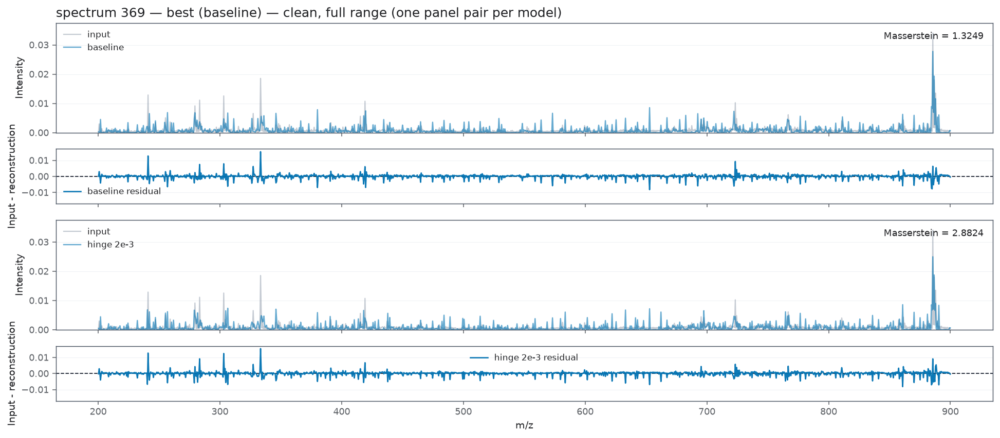

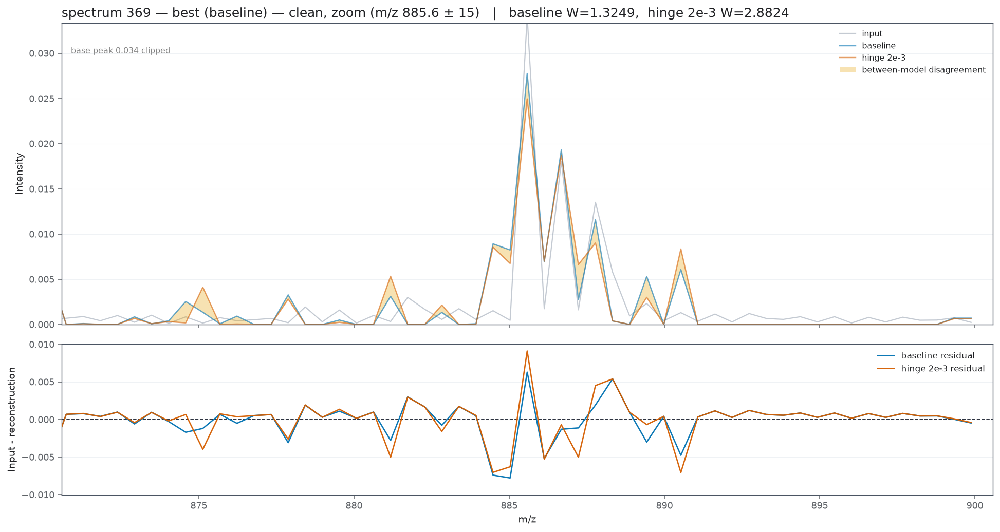

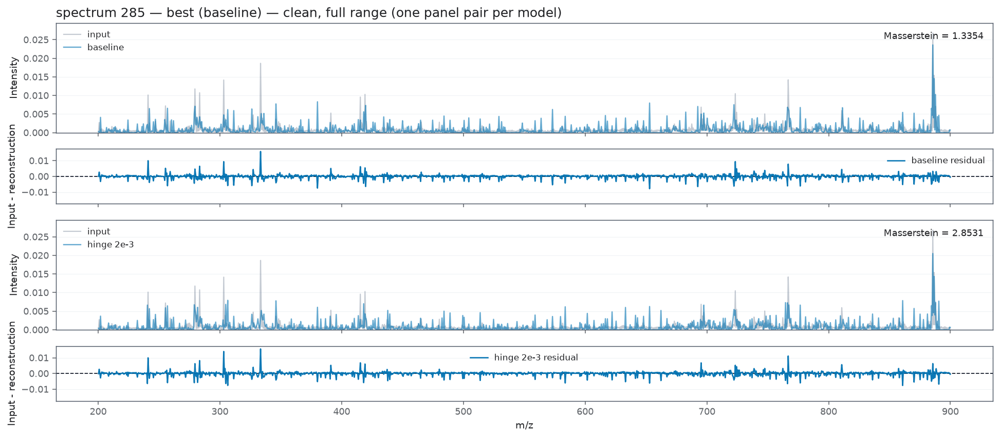

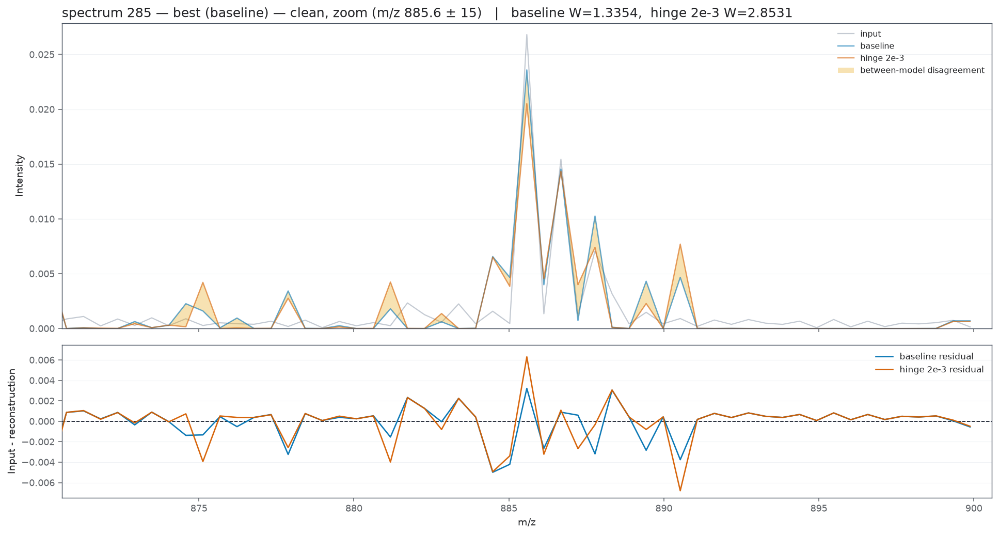

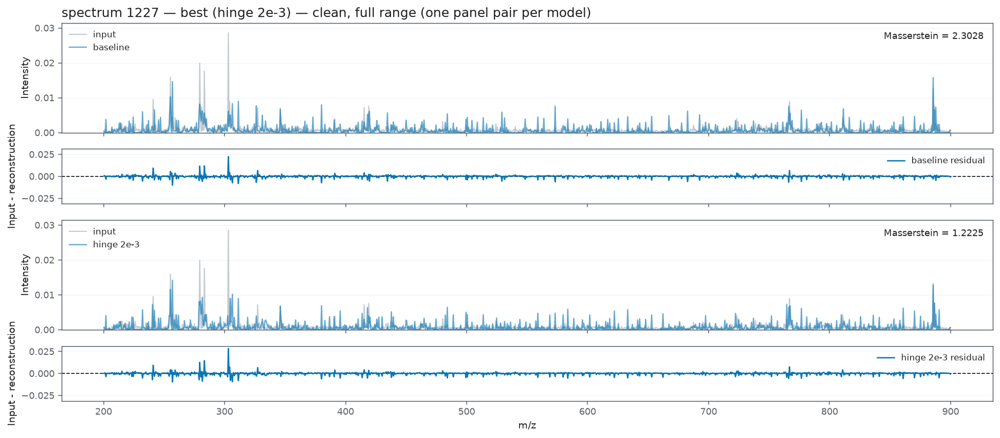

...

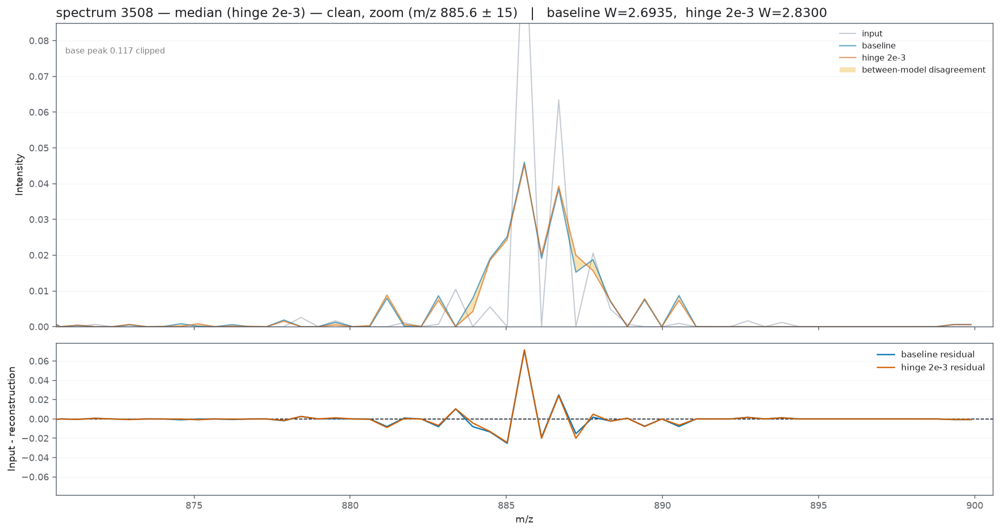

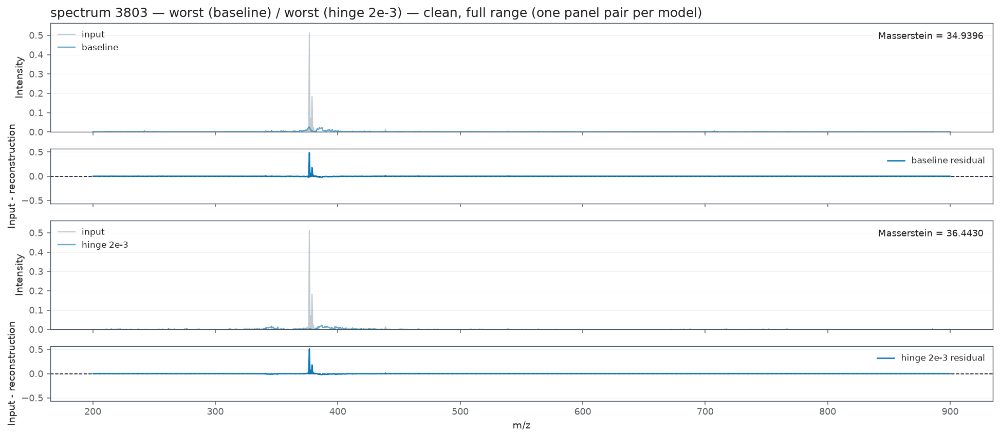

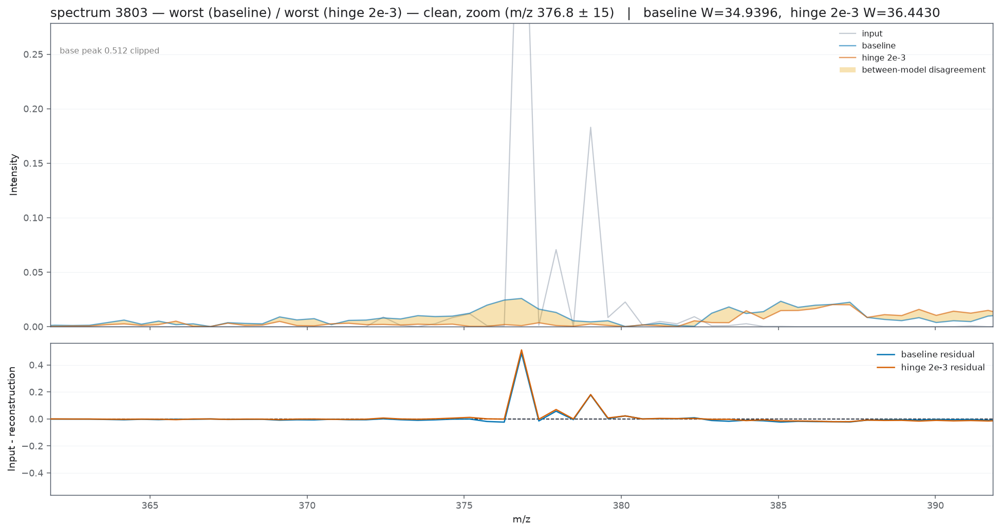

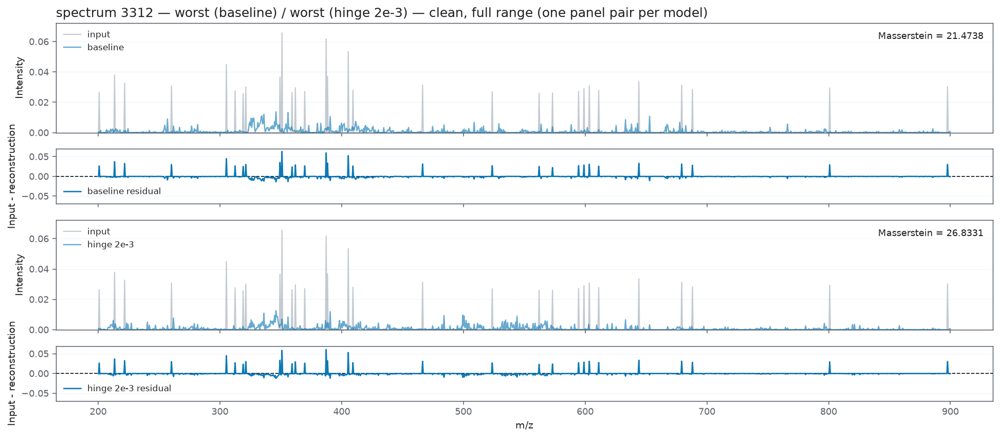

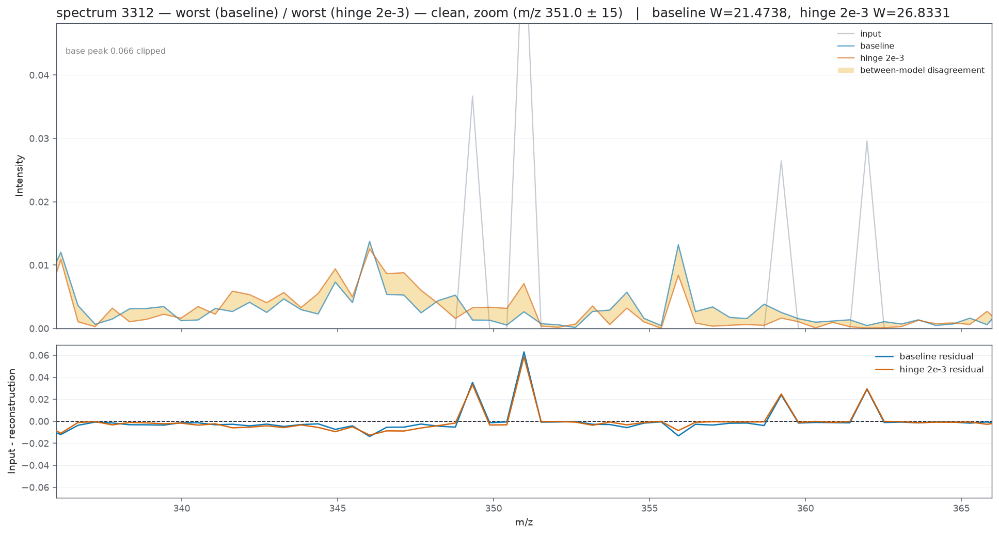

In [6]:
def plot_case_full_range(row: int, original: np.ndarray, traces: dict, costs: dict) -> None:
    """Full m/z range, one signal and residual pair per model, on shared scales."""
    figure, axes = plt.subplots(
        2 * len(traces), 1, figsize=(14.0, 3.1 * len(traces)), dpi=theme.figure_dpi,
        sharex=True, gridspec_kw={"height_ratios": [2.0, 1.0] * len(traces)},
    )
    signal_max = 1.1 * max([original.max()] + [trace.max() for trace in traces.values()])
    residual_max = 1.1 * max(np.abs(original - trace).max() for trace in traces.values())
    for index, (label, trace) in enumerate(traces.items()):
        signal_axis, residual_axis = axes[2 * index], axes[2 * index + 1]
        plot_spectrum_comparison(mass_axis, original, {label: trace}, axes=(signal_axis, residual_axis), theme=theme)
        signal_axis.set_ylim(0.0, signal_max)
        residual_axis.set_ylim(-residual_max, residual_max)
        signal_axis.text(
            0.99, 0.92, f"Masserstein = {costs[label]:.4f}", transform=signal_axis.transAxes,
            ha="right", va="top", fontsize=9,
        )
        if index < len(traces) - 1:
            residual_axis.set_xlabel("")
    axes[0].set_title(
        f"spectrum {test_split.indices[selection][row]} — {case_label.get(row, 'selected')} — "
        "clean, full range (one panel pair per model)",
        loc="left",
    )
    figure.tight_layout()


def plot_case_zoom(row: int, original: np.ndarray, traces: dict, costs: dict) -> None:
    """Peak neighbourhood with both models and their disagreement band."""
    figure, (signal_axis, residual_axis) = plot_spectrum_comparison(mass_axis, original, traces, theme=theme)
    figure.set_size_inches(14.0, 7.5)
    low, high = zoom_limits(original)
    window = (mass_axis >= low) & (mass_axis <= high)
    signal_axis.fill_between(
        mass_axis, traces["baseline"], traces["hinge 2e-3"],
        color=DISAGREEMENT_COLOR, alpha=0.30, linewidth=0, label="between-model disagreement",
    )
    for axis in (signal_axis, residual_axis):
        axis.set_xlim(low, high)
    limit, peak_height = display_limit([original, *traces.values()], window)
    signal_axis.set_ylim(0.0, limit)
    residual_limit = 1.1 * max(np.abs(original - trace)[window].max() for trace in traces.values())
    residual_axis.set_ylim(-residual_limit, residual_limit)
    if peak_height > limit:
        signal_axis.text(
            0.01, 0.92, f"base peak {peak_height:.3f} clipped", transform=signal_axis.transAxes,
            fontsize=8, va="top", color="grey",
        )
    signal_axis.legend(fontsize=8, frameon=theme.legend_frame)
    cost_text = ",  ".join(f"{label} W={costs[label]:.4f}" for label in traces)
    signal_axis.set_title(
        f"spectrum {test_split.indices[selection][row]} — {case_label.get(row, 'selected')} — "
        f"clean, zoom (m/z {0.5 * (low + high):.1f} ± {ZOOM_HALF_WIDTH_MZ:.0f})   |   {cost_text}",
        loc="left",
    )
    figure.tight_layout()


for row in shown_rows:
    original = clean[row].cpu().numpy()
    traces = {label: clean_reconstruction[label][row].cpu().numpy() for label in COMPARED}
    costs = {label: float(clean_cost[label][row]) for label in COMPARED}
    plot_case_full_range(row, original, traces, costs)
    plot_case_zoom(row, original, traces, costs)

## Every perturbation and every amplitude, per case

### Methodology

#### Theoretical

The notebook's central figure, drawn once per selected case. Each row is one perturbation
family and each column one amplitude, so reading a row left to right shows the spectrum being
progressively deformed and both models responding. The leftmost column is the unperturbed
input, so every row starts from the same reference and the progression is visible rather than
inferred.

The shaded band between the two reconstructions is the quantity of interest. On clean input it
is the models' intrinsic disagreement; as the amplitude grows, any widening is the two
encoders responding differently to the same change, which is what the penalty is supposed to
produce. Drawing this for the best, median and worst reconstructions separately answers a
question a single case cannot: whether the effect is confined to spectra the models already
handle well.

#### Implementation

Amplitudes interpolate toward the fully perturbed spectrum and renormalize, so the direction
stays fixed while its size changes. Both models receive identical inputs at every amplitude,
including identical noise draws for the stochastic families. Panels within a row share their
vertical scale so movement along the row is comparable, and the m/z window is fixed for the
whole figure, centred on the strongest peak of that case's clean spectrum.

#### Figure descriptions

One figure per selected case, titled with its dataset index and the categories that selected
it. Each is a grid with one pair of rows per perturbation family, named on the left, and one
column per amplitude $t$, named in the panel title together with both latent angles in
degrees. The upper row of a pair shows intensity against m/z with the perturbed input, both
reconstructions, and the shaded disagreement band; the lower shows the signed residual on a
symmetric axis. Vertical limits come from a high quantile rather than the maximum, and a
clipped base peak is annotated with its true height.

### Remarks

### Notes

,dataset_index,case,perturbation,amplitude,W baseline,W hinge 2e-3,angle baseline,angle hinge 2e-3
3,369,best (baseline),mz_shift,1.0,27.2012,33.5543,37.7044,26.4068
7,369,best (baseline),width_jitter,1.0,13.2500,18.7323,14.3772,8.5959
11,369,best (baseline),intensity_lognormal,1.0,1.3289,3.1214,0.6109,0.4693
15,369,best (baseline),additive_noise,1.0,1.3231,2.8863,0.0583,0.1160
19,285,best (baseline),mz_shift,1.0,25.5816,30.9845,34.9055,29.0470
23,285,best (baseline),width_jitter,1.0,10.7236,17.0580,14.4955,8.6535
27,285,best (baseline),intensity_lognormal,1.0,1.3885,2.6705,0.4626,0.5111
31,285,best (baseline),additive_noise,1.0,1.3423,2.8292,0.1319,0.1076
35,1227,best (hinge 2e-3),mz_shift,1.0,95.6173,85.5953,46.1154,42.1312
39,1227,best (hinge 2e-3),width_jitter,1.0,25.1721,17.9724,14.9123,11.9773


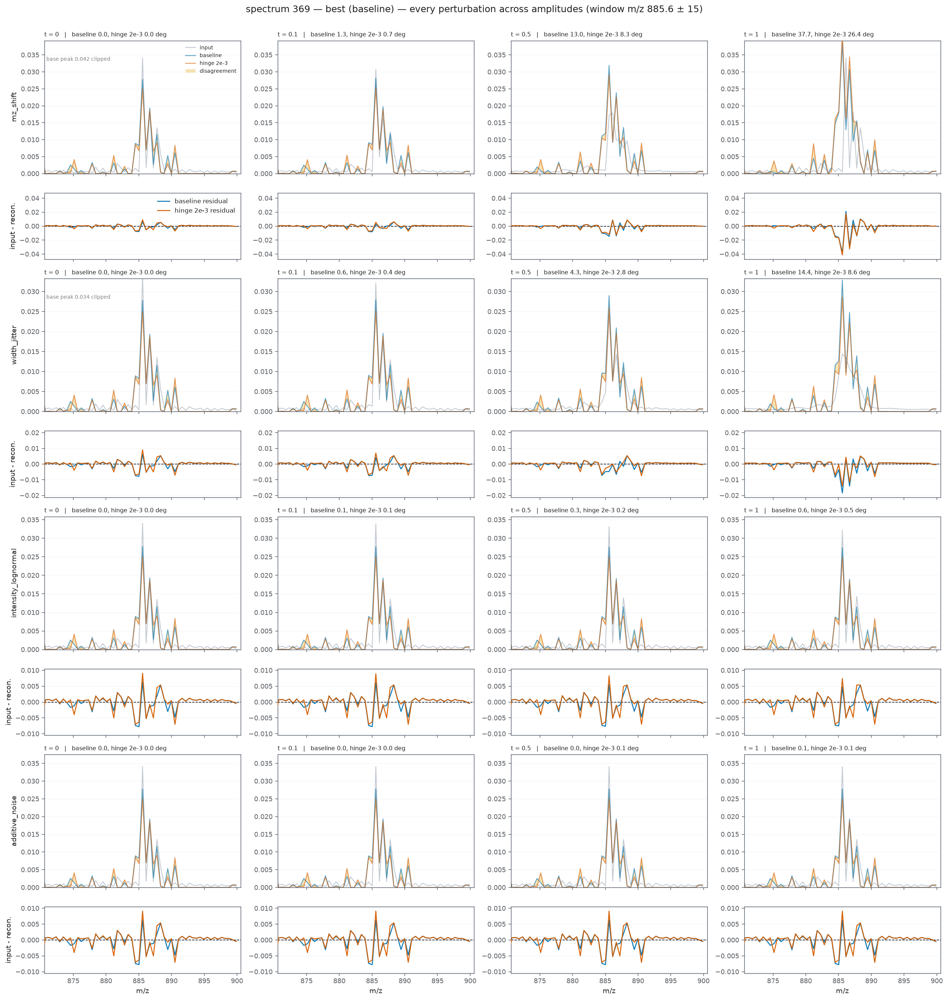

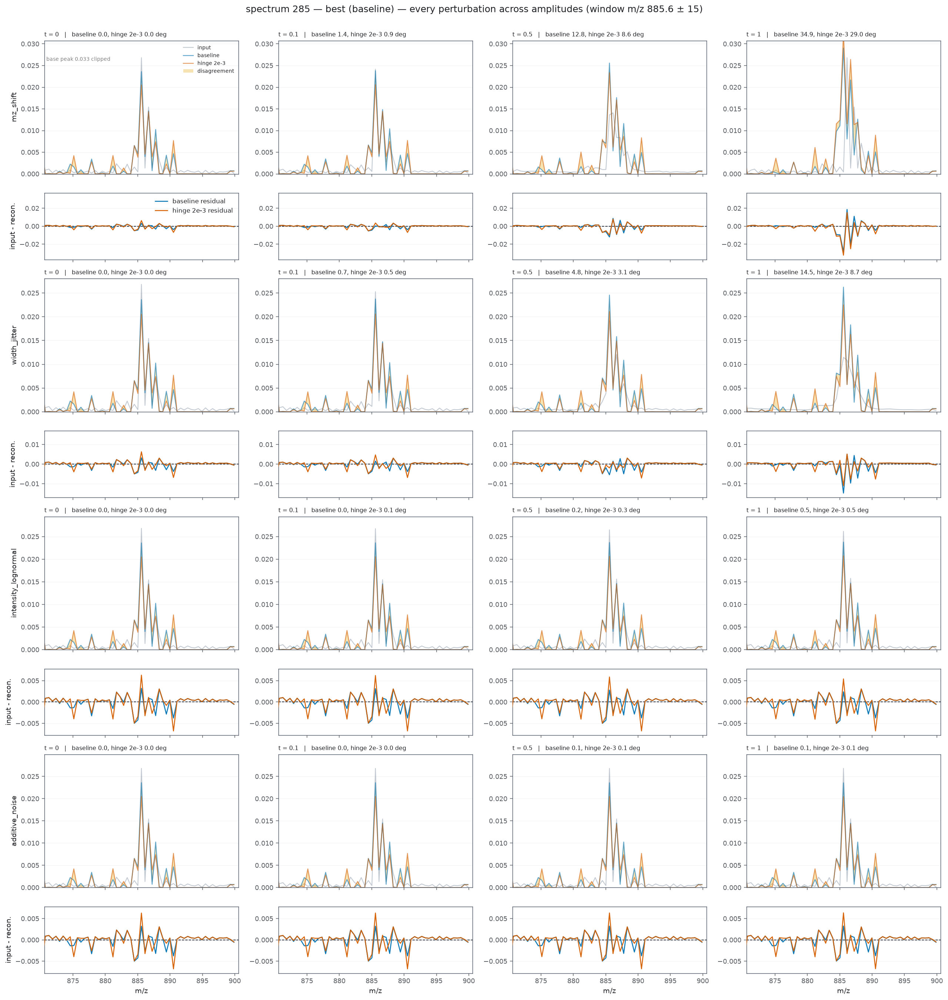

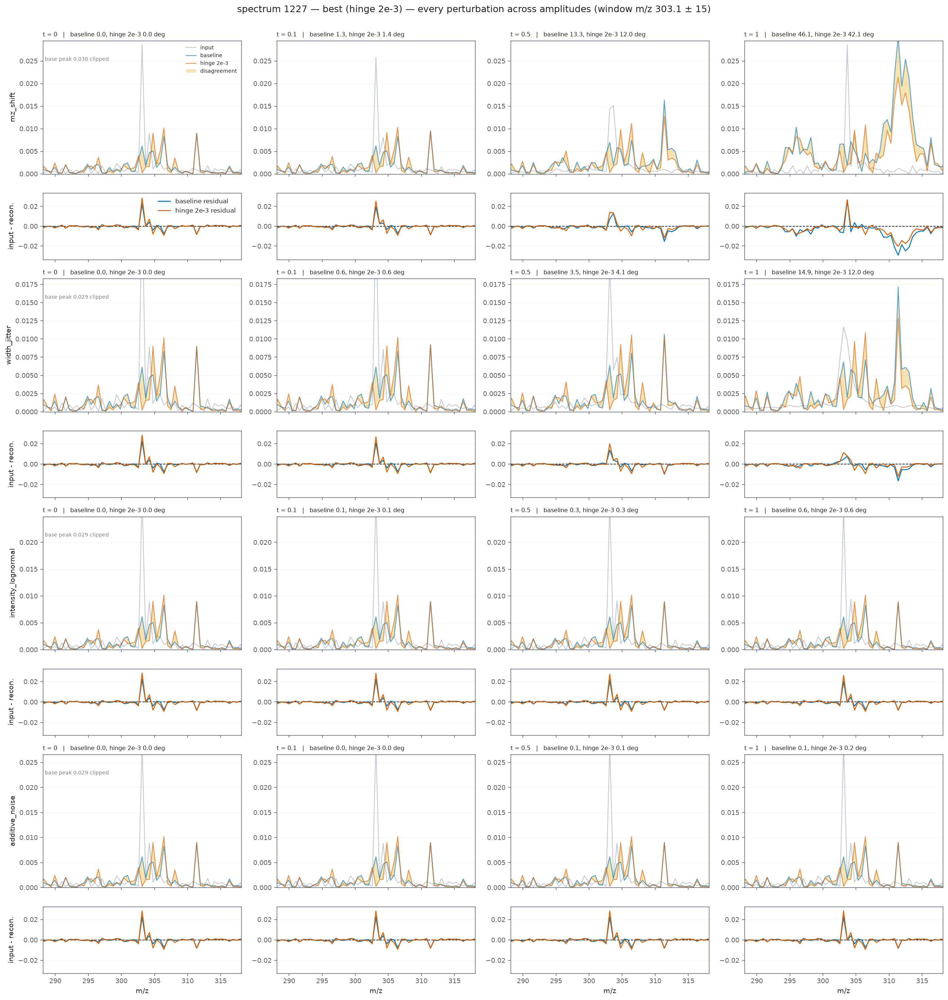

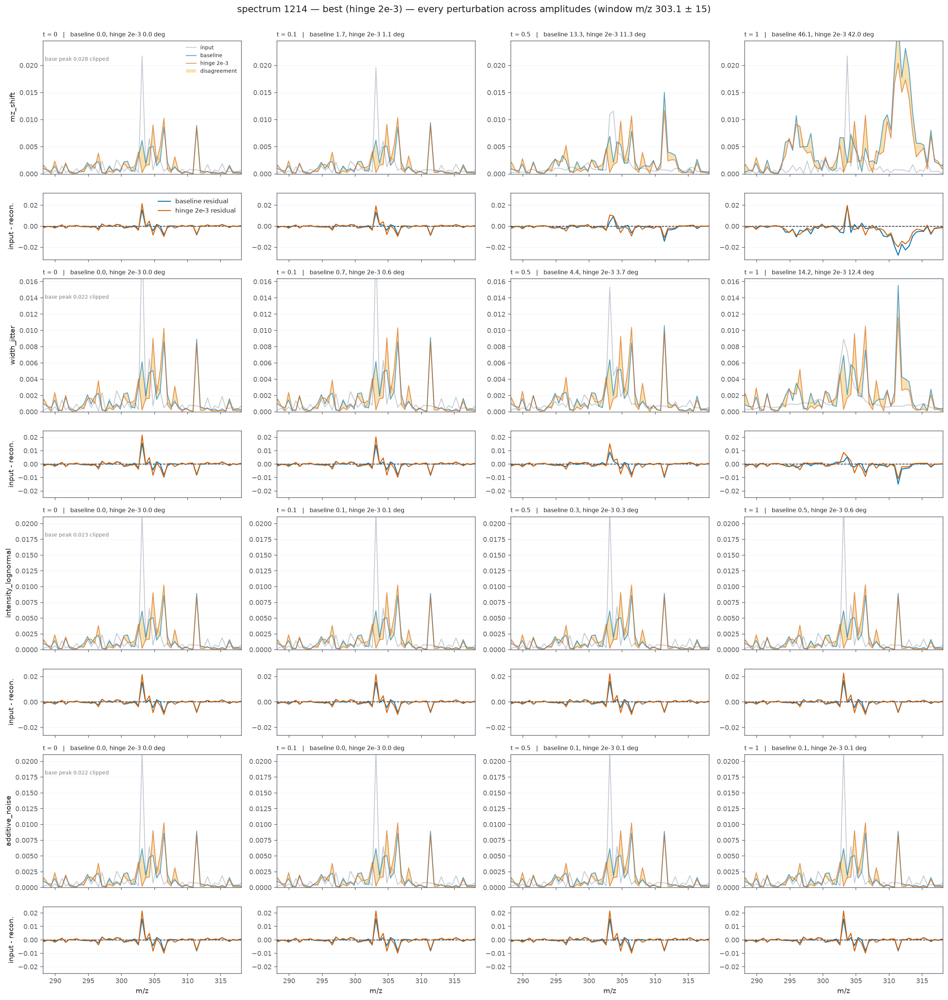

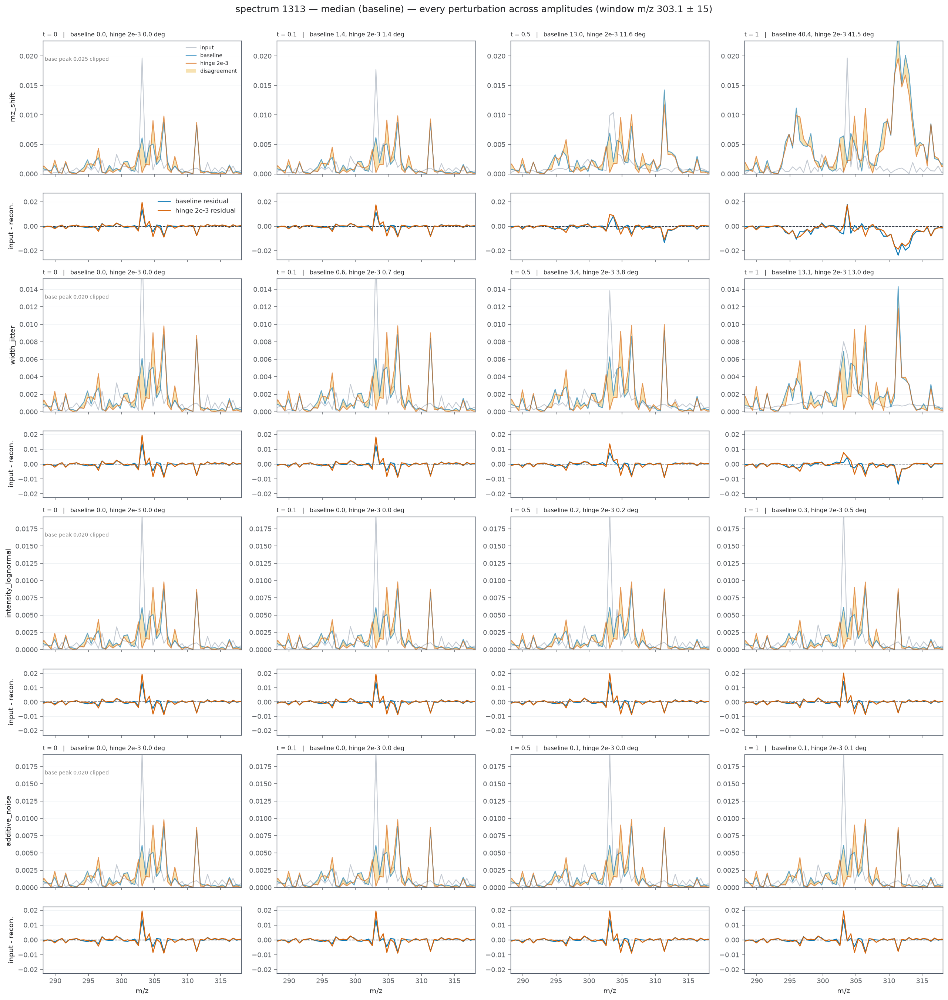

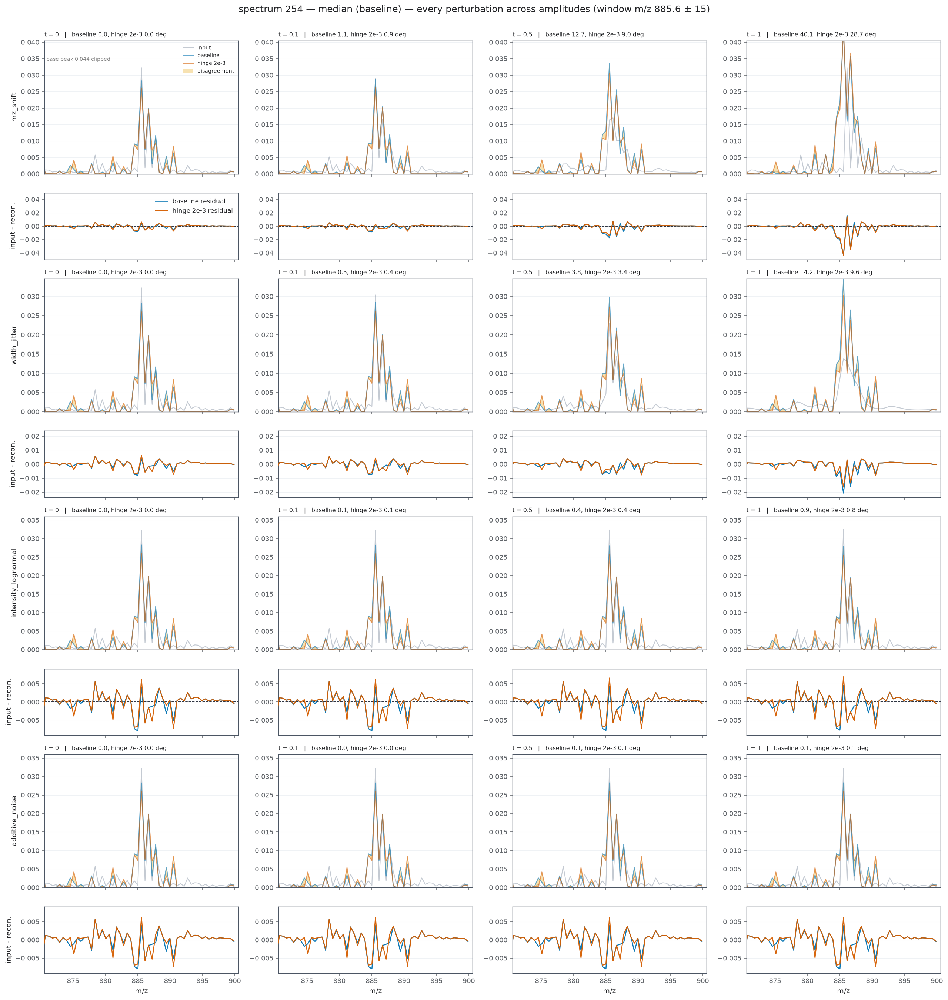

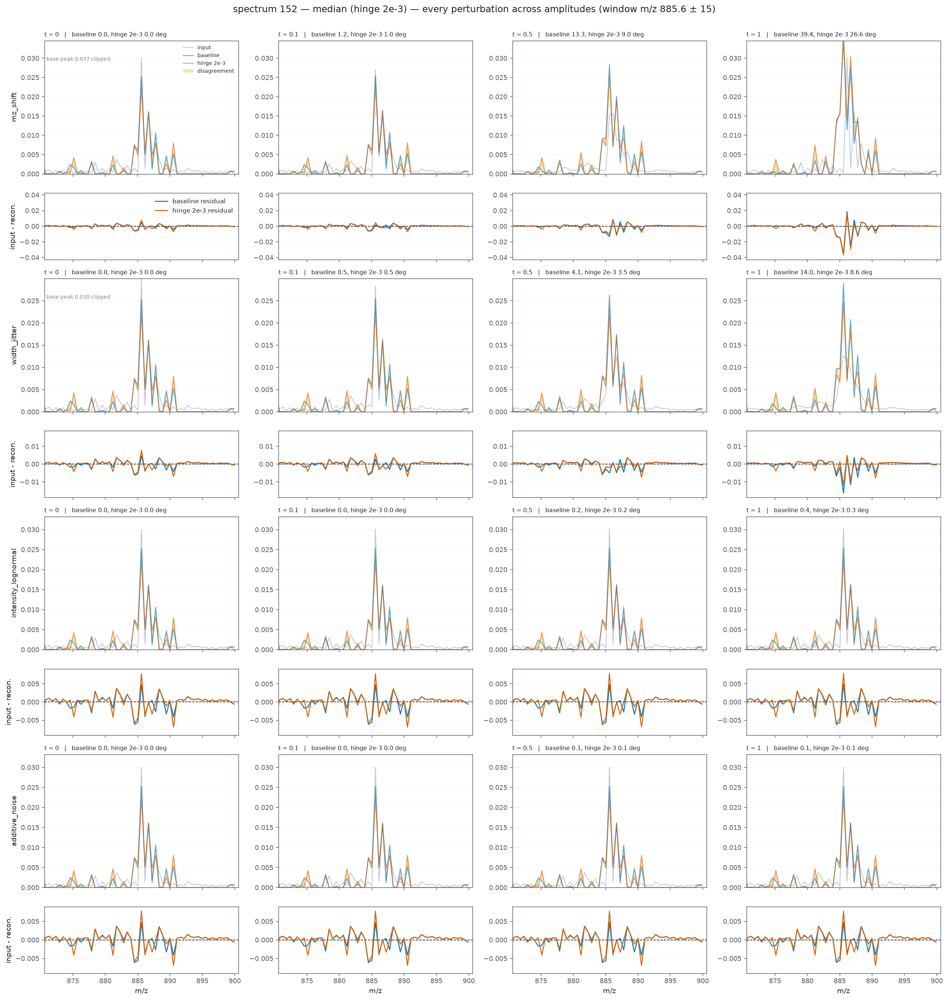

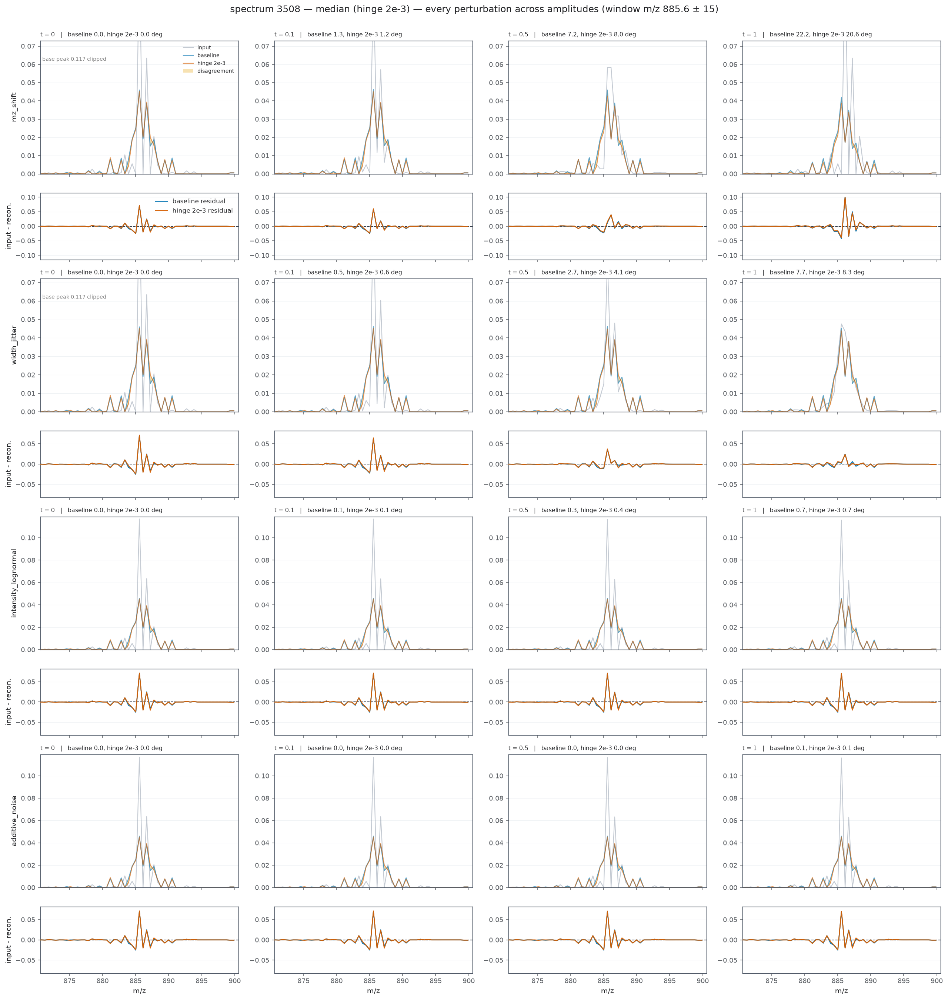

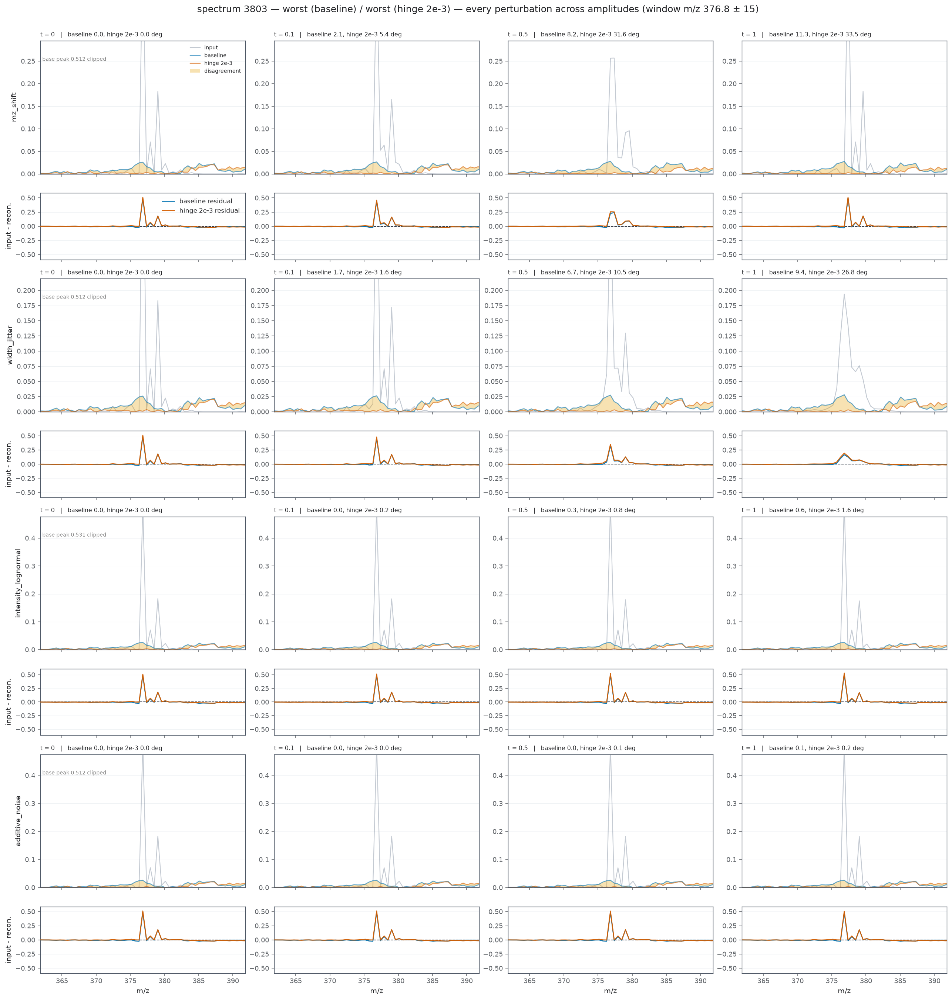

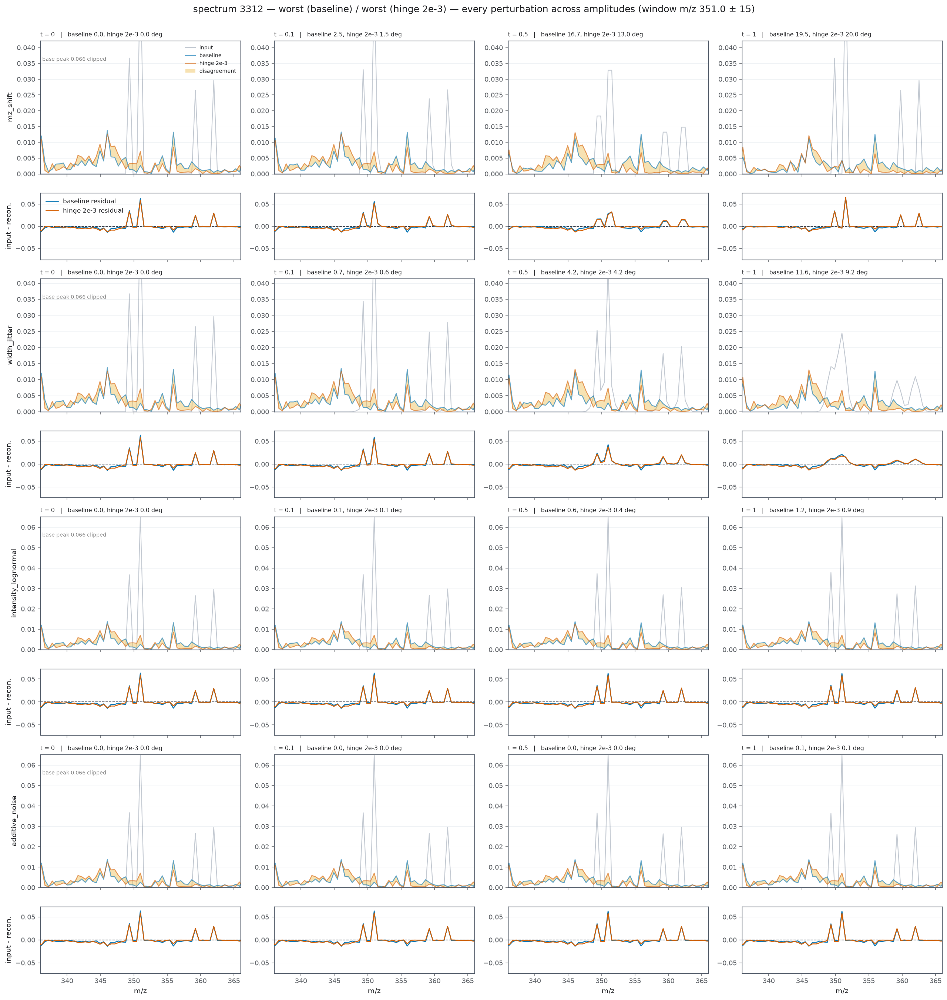

In [7]:
perturbed_by_amplitude = {
    (name, amplitude): perturbation.interpolate_perturbation(clean, target, amplitude)
    for name, target in targets.items()
    for amplitude in DISPLAY_AMPLITUDES
}

panel_rows = []
for case_row in shown_rows:
    zoom_low, zoom_high = zoom_limits(clean[case_row].cpu().numpy())
    zoom_mask = (mass_axis >= zoom_low) & (mass_axis <= zoom_high)

    ## Collect every panel of this case before drawing, so row scales can be shared
    panels = {}
    for name in perturbation.PERTURBATION_NAMES:
        for amplitude in DISPLAY_AMPLITUDES:
            blended = perturbed_by_amplitude[(name, amplitude)][case_row : case_row + 1]
            traces, angles = {}, {}
            for label, model in models.items():
                traces[label] = reconstruct(model, blended)[0].cpu().numpy()  # (M,)
                angles[label] = float(np.degrees(
                    paired_direction_angles(
                        clean_direction[label][case_row : case_row + 1],
                        latent_directions(model, blended),
                    ).cpu().numpy()[0]
                ))
            spectrum_in = blended[0].cpu().numpy()
            costs = spectrum_costs(spectrum_in, traces)
            panels[(name, amplitude)] = {"input": spectrum_in, "traces": traces, "angles": angles}
            panel_rows.append({
                "dataset_index": int(test_split.indices[selection][case_row]),
                "case": case_label.get(case_row, "selected"),
                "perturbation": name, "amplitude": float(amplitude),
                **{f"W {label}": costs[label] for label in COMPARED},
                **{f"angle {label}": angles[label] for label in COMPARED},
            })

    rows = 2 * len(perturbation.PERTURBATION_NAMES)
    figure, axes = plt.subplots(
        rows, len(DISPLAY_AMPLITUDES),
        figsize=(4.6 * len(DISPLAY_AMPLITUDES), 2.4 * rows), dpi=theme.figure_dpi,
        sharex=True, gridspec_kw={"height_ratios": [2.0, 1.0] * len(perturbation.PERTURBATION_NAMES)},
    )
    for row, name in enumerate(perturbation.PERTURBATION_NAMES):
        row_traces = [panels[(name, a)]["input"] for a in DISPLAY_AMPLITUDES]
        row_traces += [t for a in DISPLAY_AMPLITUDES for t in panels[(name, a)]["traces"].values()]
        row_limit, row_peak = display_limit(row_traces, zoom_mask)
        residual_limit = 1.15 * max(
            np.abs(panels[(name, a)]["input"] - trace)[zoom_mask].max()
            for a in DISPLAY_AMPLITUDES for trace in panels[(name, a)]["traces"].values()
        )
        for column, amplitude in enumerate(DISPLAY_AMPLITUDES):
            entry = panels[(name, amplitude)]
            signal_axis, residual_axis = axes[2 * row, column], axes[2 * row + 1, column]
            plot_spectrum_comparison(
                mass_axis, entry["input"], entry["traces"], axes=(signal_axis, residual_axis), theme=theme,
            )
            signal_axis.fill_between(
                mass_axis, entry["traces"]["baseline"], entry["traces"]["hinge 2e-3"],
                color=DISAGREEMENT_COLOR, alpha=0.30, linewidth=0, label="disagreement",
            )
            for axis in (signal_axis, residual_axis):
                axis.set_xlim(zoom_low, zoom_high)
            signal_axis.set_ylim(0.0, row_limit)
            residual_axis.set_ylim(-residual_limit, residual_limit)
            angle_text = ", ".join(f"{label} {entry['angles'][label]:.1f}" for label in COMPARED)
            signal_axis.set_title(f"t = {amplitude:g}   |   {angle_text} deg", fontsize=8, loc="left")
            signal_axis.set_ylabel(name if column == 0 else "")
            residual_axis.set_ylabel("input - recon." if column == 0 else "")
            residual_axis.set_xlabel("m/z" if row == len(perturbation.PERTURBATION_NAMES) - 1 else "")
            if row == 0 and column == 0:
                signal_axis.legend(fontsize=7, frameon=theme.legend_frame)
            else:
                for axis in (signal_axis, residual_axis):
                    legend = axis.get_legend()
                    if legend is not None:
                        legend.remove()
        if row_peak > row_limit:
            axes[2 * row, 0].text(
                0.01, 0.88, f"base peak {row_peak:.3f} clipped", transform=axes[2 * row, 0].transAxes,
                fontsize=7, va="top", color="grey",
            )
    figure.suptitle(
        f"spectrum {test_split.indices[selection][case_row]} — {case_label.get(case_row, 'selected')} — "
        f"every perturbation across amplitudes (window m/z {0.5 * (zoom_low + zoom_high):.1f} "
        f"± {ZOOM_HALF_WIDTH_MZ:.0f})",
        y=1.002, fontsize=13,
    )
    figure.tight_layout()

panel_frame = pd.DataFrame(panel_rows)
display(panel_frame.query("amplitude == 1.0").round(4))

## How the models diverge as the perturbation grows

### Methodology

#### Theoretical

The figures above show selected spectra; this section measures the same quantities across the
whole sample so the case-level picture can be checked against the population.

- **Latent displacement** is what the penalty bounds and what `part_5` aggregated.
- **Reconstruction drift** is how far each model's output moves from its own clean output,
  measured with the Masserstein cost the models were trained to minimize. Comparing it to the
  latent displacement answers whether a stabilized code reaches the decoder at all.
- **Between-model disagreement** is the Masserstein distance between the two reconstructions
  at the same amplitude. Unlike the first two it needs no per-model reference, and its growth
  with amplitude is the cleanest single statement of how differently the two encoders behave.

Distributions are reported rather than means, because a difference that holds for the median
spectrum and one driven by a tail have different consequences for a decision.

#### Implementation

All three are computed over the full spectrum sample at each amplitude, with identical inputs
and identical noise draws for both models. The zero-amplitude point is evaluated rather than
assumed, as a check that the pipeline introduces no spurious displacement.

#### Figure descriptions

Three rows of panels, one column per perturbation family. The top row plots amplitude against
median latent angular displacement in degrees, the middle against median reconstruction drift
in Masserstein cost, and the bottom against median between-model disagreement, all on
logarithmic axes with the zero-amplitude point excluded and reported separately. Lines are
colored by model in the first two rows; the third has one line, since disagreement is a
property of the pair.

### Remarks

### Notes

Zero-amplitude residual (angle and drift): 6.22e-07


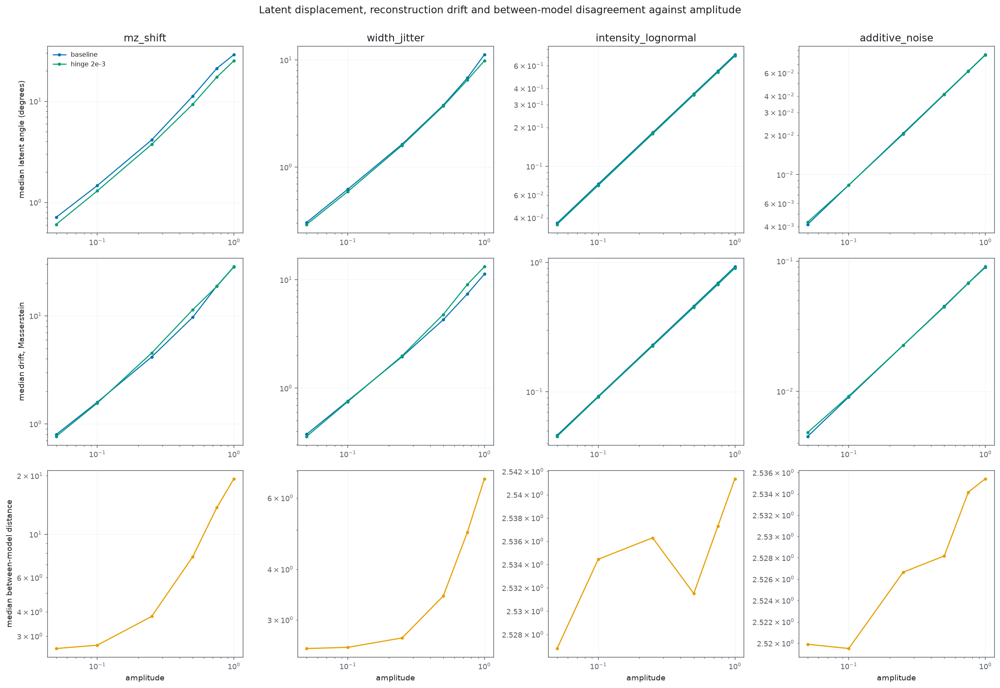

In [8]:
curve_rows, distribution_samples = [], {}
for name, target in targets.items():
    for amplitude in CURVE_AMPLITUDES:
        blended = perturbation.interpolate_perturbation(clean, target, amplitude)
        reconstructions = {}
        for label, model in models.items():
            reconstructions[label] = reconstruct(model, blended)
            angles = np.degrees(
                paired_direction_angles(clean_direction[label], latent_directions(model, blended)).cpu().numpy()
            )
            drift = transport_distance(reconstructions[label], clean_reconstruction[label])  # (N,)
            euclidean_drift = torch.linalg.vector_norm(
                reconstructions[label] - clean_reconstruction[label], dim=1
            ).cpu().numpy()
            curve_rows.append({
                "perturbation": name, "amplitude": float(amplitude), "model": label,
                "median_angle_degrees": float(np.median(angles)),
                "median_drift_masserstein": float(np.median(drift)),
                "median_drift_euclidean": float(np.median(euclidean_drift)),
            })
            if amplitude == 1.0:
                distribution_samples[(name, label, "angle")] = angles
                distribution_samples[(name, label, "drift")] = drift
        disagreement = transport_distance(reconstructions["baseline"], reconstructions["hinge 2e-3"])  # (N,)
        euclidean_disagreement = torch.linalg.vector_norm(
            reconstructions["baseline"] - reconstructions["hinge 2e-3"], dim=1
        ).cpu().numpy()
        curve_rows.append({
            "perturbation": name, "amplitude": float(amplitude), "model": "between models",
            "median_angle_degrees": np.nan,
            "median_drift_masserstein": float(np.median(disagreement)),
            "median_drift_euclidean": float(np.median(euclidean_disagreement)),
        })
        if amplitude in (0.0, 1.0):
            distribution_samples[(name, "between models", f"disagreement_t{amplitude:g}")] = disagreement

curve_frame = pd.DataFrame(curve_rows)
zero_residual = (
    curve_frame.query("amplitude == 0 and model != 'between models'")[["median_angle_degrees", "median_drift_masserstein"]]
    .abs().max().max()
)
print(f"Zero-amplitude residual (angle and drift): {zero_residual:.3g}")

positive = curve_frame.query("amplitude > 0")
figure, axes = plt.subplots(3, len(perturbation.PERTURBATION_NAMES), figsize=(4.4 * len(perturbation.PERTURBATION_NAMES), 12.0), dpi=theme.figure_dpi)
for column, name in enumerate(perturbation.PERTURBATION_NAMES):
    family = positive.query("perturbation == @name")
    for label in COMPARED:
        run = family.query("model == @label").sort_values("amplitude")
        axes[0, column].plot(run["amplitude"], run["median_angle_degrees"], color=MODEL_COLOR[label], marker="o", markersize=3, linewidth=1.3, label=label)
        axes[1, column].plot(run["amplitude"], run["median_drift_masserstein"], color=MODEL_COLOR[label], marker="o", markersize=3, linewidth=1.3, label=label)
    pair = family.query("model == 'between models'").sort_values("amplitude")
    axes[2, column].plot(pair["amplitude"], pair["median_drift_masserstein"], color=DISAGREEMENT_COLOR, marker="o", markersize=3, linewidth=1.4)
    for row, ylabel in ((0, "median latent angle (degrees)"), (1, "median drift, Masserstein"), (2, "median between-model distance")):
        axes[row, column].set_xscale("log")
        axes[row, column].set_yscale("log")
        axes[row, column].set(xlabel="amplitude" if row == 2 else "", ylabel=ylabel if column == 0 else "", title=name if row == 0 else "")
        axes[row, column].grid(theme.grid_visible, alpha=theme.grid_alpha)
axes[0, 0].legend(fontsize=8, frameon=theme.legend_frame)
figure.suptitle("Latent displacement, reconstruction drift and between-model disagreement against amplitude", y=1.001, fontsize=13)
figure.tight_layout()

## Spread across spectra at full perturbation

### Methodology

#### Theoretical

The curves above report medians. Whether a median difference reflects the typical spectrum or
is produced by a minority is a separate question, and it decides how far the result can be
relied on. At full perturbation the per-spectrum values are therefore shown as distributions.

The between-model disagreement is shown at both zero and full amplitude in the same panel,
which makes the comparison self-contained: the clean-input distribution is the models'
intrinsic difference, and the separation between the two distributions is what the
perturbation added.

#### Implementation

Every spectrum in the sample contributes one value per family. The violins use all of them;
the overlaid points are a fixed subsample drawn with a seeded generator, since one point per
spectrum is unreadable.

#### Figure descriptions

The left panel shows, per family, the distribution across spectra of the latent angular
displacement at full perturbation, one violin per model, on a logarithmic y-axis. The middle
panel shows reconstruction drift in Masserstein cost in the same layout. The right panel shows
the between-model disagreement with two violins per family, one at zero amplitude and one at
full amplitude, so the widening attributable to the perturbation is read as the gap between
the pair.

### Remarks

### Notes

model,baseline,between models,hinge 2e-3
perturbation,,,
additive_noise,0.09065,2.53542,0.08959
intensity_lognormal,0.92637,2.54137,0.90294
mz_shift,28.47687,19.31754,28.35734
width_jitter,11.28542,6.69178,13.20881


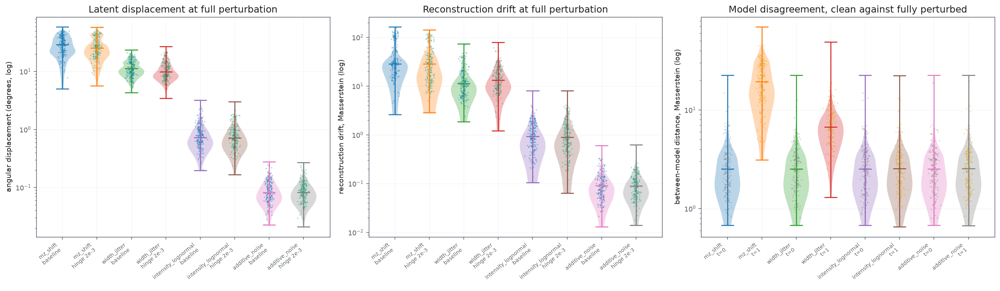

In [9]:
point_rng = np.random.default_rng(SAMPLE_SEED + 11)
POINT_SAMPLE = 200


def draw_group(axis, samples_by_position, labels, colors, ylabel, title):
    for position, values in samples_by_position.items():
        values = np.asarray(values)
        values = values[values > 0]
        if not len(values):
            continue
        axis.violinplot([values], positions=[position], widths=0.75, showmedians=True)
        shown = point_rng.choice(values, min(POINT_SAMPLE, len(values)), replace=False)
        axis.scatter(position + point_rng.normal(0.0, 0.06, size=len(shown)), shown,
                     color=colors[position], s=4, alpha=0.3, edgecolor="none")
    axis.set_yscale("log")
    axis.set_xticks(list(labels))
    axis.set_xticklabels(list(labels.values()), rotation=40, ha="right", fontsize=7)
    axis.set(ylabel=ylabel, title=title)
    axis.grid(theme.grid_visible, alpha=theme.grid_alpha)


figure, axes = plt.subplots(1, 3, figsize=(19.0, 5.6), dpi=theme.figure_dpi)
for axis, (kind, ylabel, title) in zip(
    axes[:2],
    (("angle", "angular displacement (degrees, log)", "Latent displacement at full perturbation"),
     ("drift", "reconstruction drift, Masserstein (log)", "Reconstruction drift at full perturbation")),
):
    samples, labels, colors = {}, {}, {}
    position = 0
    for name in perturbation.PERTURBATION_NAMES:
        for label in COMPARED:
            samples[position] = distribution_samples[(name, label, kind)]
            labels[position] = f"{name}\n{label}"
            colors[position] = MODEL_COLOR[label]
            position += 1
    draw_group(axis, samples, labels, colors, ylabel, title)

samples, labels, colors = {}, {}, {}
position = 0
for name in perturbation.PERTURBATION_NAMES:
    for amplitude in (0.0, 1.0):
        samples[position] = distribution_samples[(name, "between models", f"disagreement_t{amplitude:g}")]
        labels[position] = f"{name}\nt={amplitude:g}"
        colors[position] = "grey" if amplitude == 0.0 else DISAGREEMENT_COLOR
        position += 1
draw_group(axes[2], samples, labels, colors, "between-model distance, Masserstein (log)", "Model disagreement, clean against fully perturbed")
figure.tight_layout()

display(
    curve_frame.query("amplitude == 1.0")
    .pivot_table(index="perturbation", columns="model", values="median_drift_masserstein")
    .round(5)
)

## Reproducible artifacts

### Methodology

#### Implementation

The selected cases, their per-panel costs and angles, the amplitude curves and the
full-perturbation per-spectrum distributions are persisted, together with the dataset indices
of the analysed and displayed spectra. Provenance records the two compared models, the
perturbation settings, the amplitude schedules, seeds, library versions, the commit and a
hash of the perturbation module.

### Remarks

### Notes

In [10]:
distribution_frame = pd.DataFrame([
    {"perturbation": name, "model": label, "quantity": kind,
     "row": index, "dataset_index": int(test_split.indices[selection][index]), "value": float(value)}
    for (name, label, kind), values in distribution_samples.items()
    for index, value in enumerate(values)
])

frames = {
    "selected_cases": case_frame,
    "case_panels": panel_frame,
    "amplitude_curves": curve_frame,
    "full_perturbation_distributions": distribution_frame,
    "models": grid_frame,
}
for name, frame in frames.items():
    frame.to_csv(ARTIFACT_DIR / f"{name}.csv", index=False)
pd.DataFrame({"dataset_index": test_split.indices[selection]}).to_csv(ARTIFACT_DIR / "analysed_spectra.csv", index=False)

metadata = {
    "compared_models": {label: model_name_by_cell[cell] for label, cell in COMPARED.items()},
    "compared_cells": COMPARED,
    "repetition": REPETITION,
    "perturbations": list(perturbation.PERTURBATION_NAMES),
    "settings": {
        "shift_bins": PERTURBATION_SETTINGS.shift_bins,
        "extra_width_sigma": PERTURBATION_SETTINGS.extra_width_sigma,
        "base_width_sigma": PERTURBATION_SETTINGS.base_width_sigma,
        "lognormal_sigma": PERTURBATION_SETTINGS.lognormal_sigma,
        "noise_fraction": PERTURBATION_SETTINGS.noise_fraction,
    },
    "display_amplitudes": list(DISPLAY_AMPLITUDES),
    "curve_amplitudes": list(CURVE_AMPLITUDES),
    "cases_per_category": CASES_PER_CATEGORY,
    "analysed_spectra": int(clean.shape[0]),
    "displayed_dataset_indices": [int(test_split.indices[selection][row]) for row in shown_rows],
    "zoom_half_width_mz": ZOOM_HALF_WIDTH_MZ,
    "mass_axis_range": [float(mass_axis[0]), float(mass_axis[-1])],
    "sample_seed": SAMPLE_SEED,
    "zero_amplitude_residual": float(zero_residual),
    "numpy": np.__version__,
    "torch": torch.__version__,
    "git_commit": subprocess.check_output(["git", "rev-parse", "HEAD"], text=True).strip(),
    "perturbations_sha256": hashlib.sha256(Path("src/msi_autoencoder_wrapper/analysis/autoencoder/latent/perturbations.py").read_bytes()).hexdigest(),
}
(ARTIFACT_DIR / "metadata.json").write_text(json.dumps(metadata, indent=2) + "\n")
logger.info("Wrote %s table(s) and provenance to %s", len(frames), ARTIFACT_DIR)
print(sorted(path.name for path in ARTIFACT_DIR.iterdir()))

2026-09-07 23:15:30,871 | INFO     | spectrum_reconstruction:46 | Wrote 5 table(s) and provenance to assets/experiments/autoencoder_architecture/notebooks/05_09_26_contractive_expaned/part_6_spectrum_reconstruction_results


['amplitude_curves.csv', 'analysed_spectra.csv', 'case_panels.csv', 'full_perturbation_distributions.csv', 'metadata.json', 'models.csv', 'selected_cases.csv']


## Results / Summary

### LLM

**The two models agree on which spectra are hard and disagree on which are easy.** Both
select the same two worst reconstructions, dataset indices 3803 and 3312. Neither model's
best cases are easy for the other: the baseline's two best cost it 1.32 and 1.34 but cost the
penalized model 2.88 and 2.85, while the penalized model's two best cost it 1.22 and 1.26
against the baseline's 2.30 and 1.73. The two floors are comparable, 1.32 against 1.22, so
this is not one model reconstructing better; it is the two having found different solutions
that are easy on different spectra. A single arbitrarily chosen display spectrum would have
shown one of these two pictures and hidden the other.

**The robustness advantage holds on typical spectra and reverses on the hardest one.** Under
a full m/z shift the penalized model's latent moves less in seven of the ten displayed cases,
by margins consistent with `part_5`: 37.7 to 26.4 degrees, 34.9 to 29.0, 40.1 to 28.7, 39.4
to 26.6. On case 1313 the two are level, 40.4 against 41.5. On case 3803, the spectrum both
models reconstruct worst, the direction inverts sharply: 11.3 degrees for the baseline
against 33.5 for the penalized model, three times more. The penalty's benefit is therefore
not uniform over the data, and it is absent exactly where reconstruction is already failing.
This is the finding stratified selection was introduced to expose.

**On the aggregate the encoder's stabilization does not reach the output for the m/z shift.**
Median reconstruction drift at full perturbation is 28.36 for the penalized model against
28.48 for the baseline, a difference of 0.4%, while `part_5` measured a 13% smaller latent
displacement. The decoder absorbs essentially the whole of the encoder's advantage in this
direction.

**Under peak broadening the penalized model drifts more, not less**, 13.21 against 11.29 in
Masserstein cost, a 17% increase. An earlier Euclidean-based version of this notebook
reported a 10% decrease. The reversal is informative: the ratio of the two distances differs
by model, so the penalized model's reconstruction error under broadening is displaced along
m/z rather than changed in amplitude, and a transport cost charges for that displacement
while a Euclidean norm does not. Reading robustness off the Euclidean norm would credit the
penalty with an improvement it does not have on its own training objective.

**Between-model disagreement grows only where the penalty acts.** It is 2.52 on clean input
for every family by construction, and at full perturbation reaches 19.32 for the m/z shift
and 6.69 for broadening, increases of 667% and 166%, while the two intensity families end at
2.54 and 2.54, within 1% of where they started. The widening is confined to the families
`part_5` found the penalty acting on, which is the internal consistency check this
measurement provides: a numerical artifact would widen everywhere.

**Pipeline check.** The zero-amplitude residual is $6.2\times10^{-7}$, so the amplitude sweep
starts from an exact zero.

**Caveat.** All figures use repetition 0 of each configuration. `part_5` established the
direction of the latent-space effects across five repetitions with paired intervals; the
reconstruction-side differences and the case-level reversal reported here are
single-repetition and carry no intervals. The broadening reversal and the behaviour on case
3803 in particular should be confirmed across seeds before either is relied on.

### Person